In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Labels

- ER: 
  - 0 = neg
  - 1 = pos
- PR: 
  - 0 = neg
  - 1 = pos
- HER2:
  - 0 = neg
  - 1 = pos
  - 2 = borderline
- Mol Subtype:
  - 0 = luminal-like
  - 1 = ER/PR pos, HER2 pos
  - 2 = HER2
  - 3 = triple negative

### Importing the dataset and its labels

In [27]:
labels = pd.read_csv('../../Data/Patient class labels.csv')
labels

,Patient ID,ER,PR,HER2,Mol Subtype
0,Breast_MRI_001,0,0,1,2
1,Breast_MRI_002,0,0,0,3
2,Breast_MRI_003,1,1,0,0
3,Breast_MRI_004,1,1,0,0
4,Breast_MRI_005,1,0,1,1
...,...,...,...,...,...
917,Breast_MRI_918,1,1,0,0
918,Breast_MRI_919,1,1,0,0
919,Breast_MRI_920,1,1,0,0
920,Breast_MRI_921,1,1,0,0


In [58]:
filename1 = "pyradiomics_extraction_box_with_correct_mask.csv"
filename2 = "pyradiomics_extraction_box_without_correct_mask.csv"
filename3 = "pyradiomics_extraction_segmentation_maskcorrect.csv"
filename4 = "pyradiomics_extraction_segmentation_no_maskcorrect.csv"

FILE_PATH = "../../Data/" + filename4
features = pd.read_csv(FILE_PATH)
# other_features = pd.read_csv('../../Data/Preprocessed_Clinical_Features.csv')
features

,patient,sequence,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,Breast_MRI_001,post_1,0.807005,0.729780,23.614309,32.358102,36.073737,38.431136,39.309346,45.798426,...,5.741796e-01,5.741796e-01,2.136700e+00,0.003961,4.009263e+06,0.0,1000000.0,0.0,0.0,0.0
1,Breast_MRI_002,post_1,0.641558,0.577887,17.378564,30.072592,23.148662,29.852205,29.748492,33.784677,...,6.011205e-01,6.011205e-01,1.823026e+00,0.001401,6.054147e+06,0.0,1000000.0,0.0,0.0,0.0
2,Breast_MRI_003,post_1,0.756223,0.272616,13.050754,47.872295,40.488107,43.126056,56.606869,57.665740,...,5.064866e-01,5.064866e-01,2.281373e+00,0.001484,1.663605e+07,0.0,1000000.0,0.0,0.0,0.0
3,Breast_MRI_004,post_1,0.718139,0.610317,8.730117,14.304230,11.420813,14.972284,14.477716,16.540987,...,3.501278e-07,3.501278e-07,-3.203427e-16,0.000592,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0
4,Breast_MRI_005,post_1,0.687760,0.436019,22.539193,51.693090,55.175581,49.674566,36.443449,58.274413,...,5.000000e-01,5.000000e-01,1.000000e+00,0.000047,4.436710e+08,0.0,1000000.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,Breast_MRI_918,post_1,0.886914,0.668151,28.553043,42.734408,45.886501,41.977361,51.383808,56.016573,...,3.266470e-10,3.266470e-10,-3.203427e-16,0.000018,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0
918,Breast_MRI_919,post_1,0.757419,0.596730,12.864613,21.558522,21.066007,20.543932,25.375225,27.268354,...,4.503200e-01,4.503200e-01,1.921928e+00,0.000938,4.485585e+06,0.0,1000000.0,0.0,0.0,0.0
919,Breast_MRI_920,post_1,0.872632,0.837806,15.199560,18.142097,19.038279,20.649190,20.505122,24.348411,...,4.626802e-08,4.626802e-08,-3.203427e-16,0.000215,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0
920,Breast_MRI_921,post_1,0.855874,0.735409,30.453436,41.410193,43.076382,45.448460,48.143552,54.398662,...,4.008642e-01,4.008642e-01,2.197160e+00,0.000230,1.504081e+08,0.0,1000000.0,0.0,0.0,0.0


In [7]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 922 entries, 0 to 921
Columns: 109 entries, patient to original_ngtdm_Strength
dtypes: float64(107), object(2)
memory usage: 785.3+ KB


### Printing Coloumn Headers

In [8]:
# Printing coloumn headers with serial number
for i in range(len(features.columns)):
    print(f"{i+1})", features.columns[i])
# sequence and patient id are not required

1) patient
2) sequence
3) original_shape_Elongation
4) original_shape_Flatness
5) original_shape_LeastAxisLength
6) original_shape_MajorAxisLength
7) original_shape_Maximum2DDiameterColumn
8) original_shape_Maximum2DDiameterRow
9) original_shape_Maximum2DDiameterSlice
10) original_shape_Maximum3DDiameter
11) original_shape_MeshVolume
12) original_shape_MinorAxisLength
13) original_shape_Sphericity
14) original_shape_SurfaceArea
15) original_shape_SurfaceVolumeRatio
16) original_shape_VoxelVolume
17) original_firstorder_10Percentile
18) original_firstorder_90Percentile
19) original_firstorder_Energy
20) original_firstorder_Entropy
21) original_firstorder_InterquartileRange
22) original_firstorder_Kurtosis
23) original_firstorder_Maximum
24) original_firstorder_MeanAbsoluteDeviation
25) original_firstorder_Mean
26) original_firstorder_Median
27) original_firstorder_Minimum
28) original_firstorder_Range
29) original_firstorder_RobustMeanAbsoluteDeviation
30) original_firstorder_RootMeanSq

### Merging the two dataframes

In [59]:
# Merging the two dataframes on patient id
total_features = pd.merge(features, labels, left_on = 'patient', right_on = 'Patient ID').drop(columns = 'Patient ID')
total_features.drop(columns = ['sequence', 'patient'], inplace = True)
total_features

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength,ER,PR,HER2,Mol Subtype
0,0.807005,0.729780,23.614309,32.358102,36.073737,38.431136,39.309346,45.798426,11352.720347,26.113156,...,4.009263e+06,0.0,1000000.0,0.0,0.0,0.0,0,0,1,2
1,0.641558,0.577887,17.378564,30.072592,23.148662,29.852205,29.748492,33.784677,4051.005400,19.293327,...,6.054147e+06,0.0,1000000.0,0.0,0.0,0.0,0,0,0,3
2,0.756223,0.272616,13.050754,47.872295,40.488107,43.126056,56.606869,57.665740,11866.396187,36.202150,...,1.663605e+07,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
3,0.718139,0.610317,8.730117,14.304230,11.420813,14.972284,14.477716,16.540987,829.333325,10.272429,...,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
4,0.687760,0.436019,22.539193,51.693090,55.175581,49.674566,36.443449,58.274413,25572.814941,35.552459,...,4.436710e+08,0.0,1000000.0,0.0,0.0,0.0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.886914,0.668151,28.553043,42.734408,45.886501,41.977361,51.383808,56.016573,28567.316541,37.901723,...,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
918,0.757419,0.596730,12.864613,21.558522,21.066007,20.543932,25.375225,27.268354,2558.161146,16.328835,...,4.485585e+06,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
919,0.872632,0.837806,15.199560,18.142097,19.038279,20.649190,20.505122,24.348411,2671.696974,15.831368,...,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
920,0.855874,0.735409,30.453436,41.410193,43.076382,45.448460,48.143552,54.398662,28568.303573,35.441921,...,1.504081e+08,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0


## Data Processing, Visualisation and Feature Selection

### Checking and Removing Null Values

In [10]:
# Checking for null values
for i in range(len(total_features.columns)):
    if total_features[total_features.columns[i]].isna().any():
        print("Null value in", total_features.columns[i])
else:
    print("No null values")

No null values


### Data Visualization

#### Distribution Plots

In [11]:
total_features.hist(figsize=(50,50), bins=20)
plt.tight_layout()
plt.show()

#### Scatter Plots

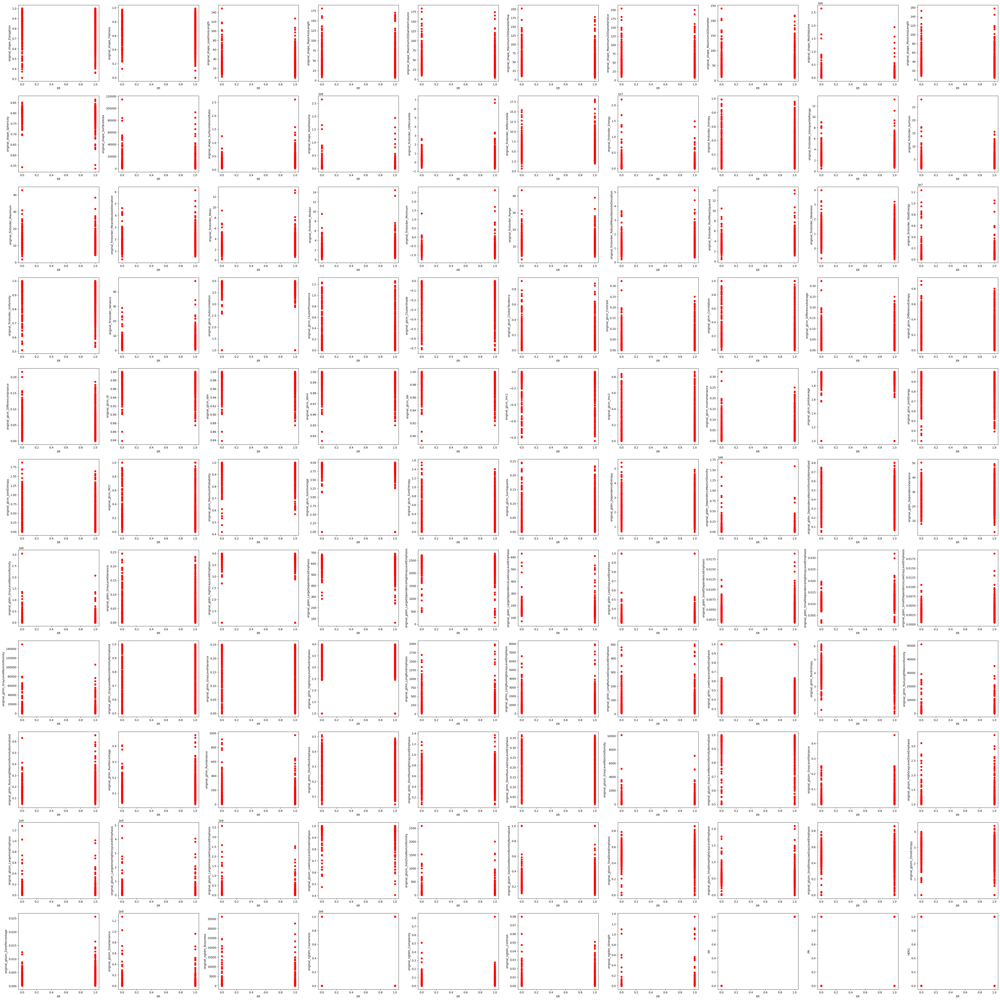

In [9]:
n1 = 11
n2 = 10
fig, ax = plt.subplots(n1, n2, figsize=(50, 50))
col = 0
for i in range(n1):
  for j in range(n2):
    ax[i][j].scatter(y=total_features[total_features.columns[col]], x=labels['ER'], color='red')
    ax[i][j].set_ylabel(total_features.columns[col])
    ax[i][j].set_xlabel('ER')
    if col == len(total_features.columns)-1:
      break
    col+=1

plt.tight_layout()
plt.show()

### Checking and removing outliers

#### Visualizing Outliers

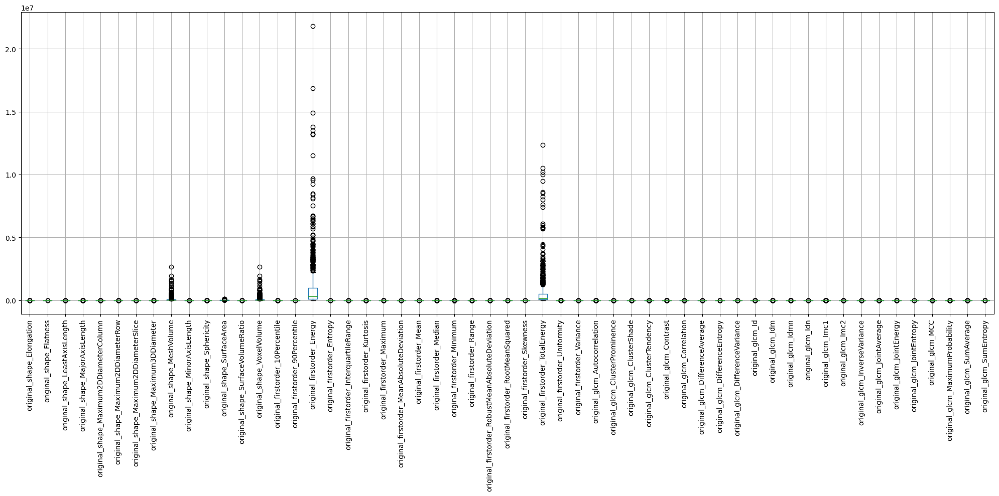

In [53]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get first 55 features
box1 = total_features.iloc[:, 0:55]
box1.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

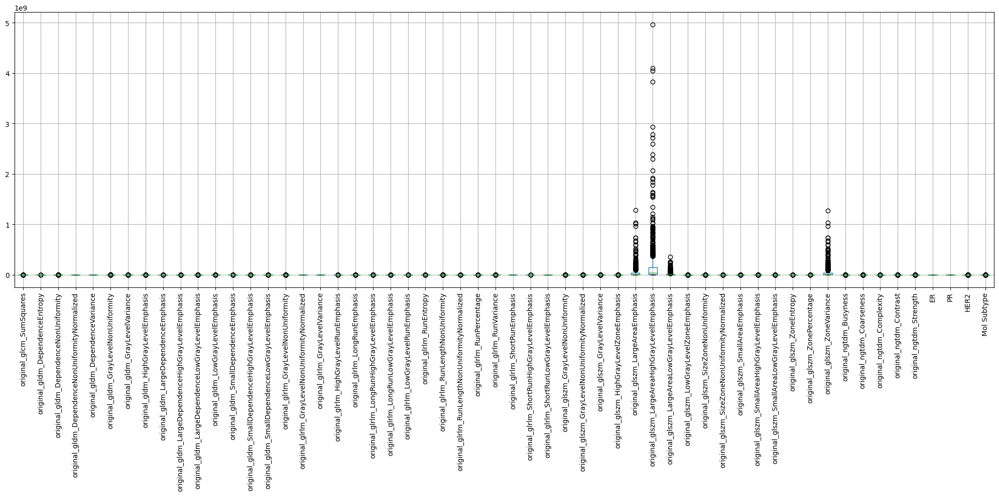

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get the remaining features
box2 = total_features.iloc[:, 55:]
box2.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

#### Z-Score

In [60]:
# Removing outliers using Z-score from the total_features dataframe
from scipy import stats
z = np.abs(stats.zscore(total_features))
print(np.where(z > 3))
z_features = total_features[(z < 3).all(axis=1)]
z_features


(array([  7,   7,   7,   7,  11,  11,  11,  11,  11,  11,  11,  11,  11,
        11,  11,  11,  11,  11,  15,  15,  23,  23,  23,  23,  23,  23,
        23,  23,  23,  27,  27,  27,  27,  27,  28,  45,  45,  45,  45,
        49,  50,  56,  56,  56,  56,  60,  60,  62,  62,  62,  62,  62,
        62,  62,  62,  62,  62,  62,  62,  62,  64,  64,  64,  64,  82,
        82,  85,  89,  89,  89,  89,  89,  89,  89,  89,  89,  89,  89,
        89,  89, 106, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107,
       107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107, 107,
       107, 107, 107, 107, 117, 118, 118, 118, 118, 143, 143, 148, 148,
       148, 148, 148, 148, 149, 149, 149, 150, 150, 167, 180, 180, 180,
       180, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 184, 185,
       196, 196, 196, 196, 196, 201, 201, 209, 209, 209, 209, 209, 209,
       209, 212, 216, 216, 218, 233, 233, 233, 233, 233, 233, 233, 233,
       233, 233, 233, 233, 233, 233, 233, 233, 233, 233, 233, 2

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength,ER,PR,HER2,Mol Subtype
0,0.807005,0.729780,23.614309,32.358102,36.073737,38.431136,39.309346,45.798426,11352.720347,26.113156,...,4.009263e+06,0.0,1000000.0,0.0,0.0,0.0,0,0,1,2
1,0.641558,0.577887,17.378564,30.072592,23.148662,29.852205,29.748492,33.784677,4051.005400,19.293327,...,6.054147e+06,0.0,1000000.0,0.0,0.0,0.0,0,0,0,3
2,0.756223,0.272616,13.050754,47.872295,40.488107,43.126056,56.606869,57.665740,11866.396187,36.202150,...,1.663605e+07,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
3,0.718139,0.610317,8.730117,14.304230,11.420813,14.972284,14.477716,16.540987,829.333325,10.272429,...,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
4,0.687760,0.436019,22.539193,51.693090,55.175581,49.674566,36.443449,58.274413,25572.814941,35.552459,...,4.436710e+08,0.0,1000000.0,0.0,0.0,0.0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
916,0.975963,0.774499,68.771301,88.794509,114.415161,112.638536,102.065813,125.770251,211743.196733,86.660192,...,2.663537e+08,0.0,1000000.0,0.0,0.0,0.0,0,0,0,3
918,0.757419,0.596730,12.864613,21.558522,21.066007,20.543932,25.375225,27.268354,2558.161146,16.328835,...,4.485585e+06,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
919,0.872632,0.837806,15.199560,18.142097,19.038279,20.649190,20.505122,24.348411,2671.696974,15.831368,...,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
920,0.855874,0.735409,30.453436,41.410193,43.076382,45.448460,48.143552,54.398662,28568.303573,35.441921,...,1.504081e+08,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0


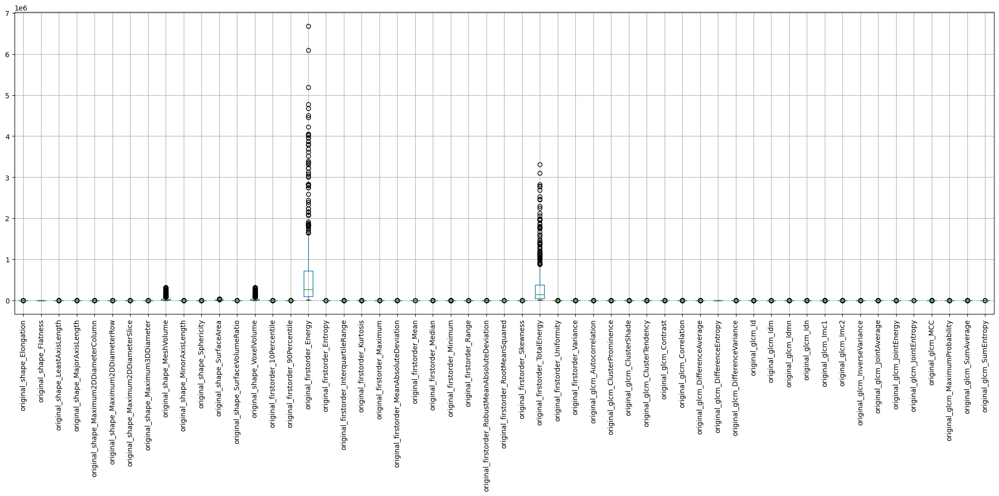

In [ ]:
# Plotting the boxplot again to check if the outliers are removed
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get first 55 features
box1 = z_features.iloc[:, 0:55]
box1.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

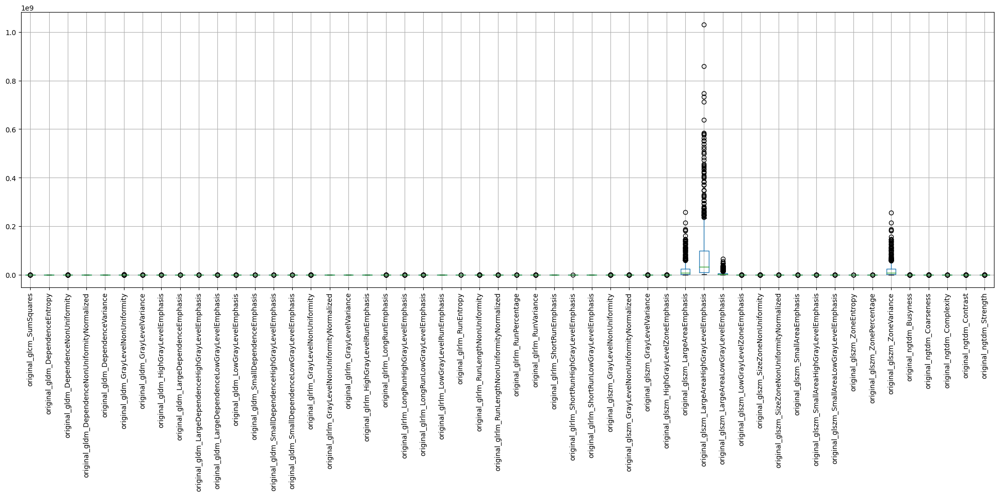

In [ ]:
# Plotting the boxplot again to check if the outliers are removed
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get the remaining features
box2 = z_features.iloc[:, 55:]
box2.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

#### IQR

In [ ]:
# Removing outliers using IQR from the total_features dataframe
Q1 = total_features.quantile(0.25)
Q3 = total_features.quantile(0.75)
IQR = Q3 - Q1
iqr_features = total_features[~((total_features < (Q1 - 1.5 * IQR)) | (total_features > (Q3 + 1.5 * IQR))).any(axis=1)]
iqr_features

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
1,0.668996,0.650923,18.931009,29.083312,23.148662,29.852205,29.748492,33.784677,6966.458183,19.456628,...,0.436616,0.436616,3.339987,0.003194,4.028316e+06,253.258853,0.001130,0.113070,0.008739,0.001129
6,0.858207,0.665375,10.787664,16.212898,17.966680,14.841245,16.480487,19.916178,1581.899041,13.914022,...,0.388103,0.388103,2.751629,0.005051,3.893663e+05,19.547480,0.013734,0.061287,0.002688,0.013705
8,0.799926,0.752420,31.728831,42.169042,39.644814,45.191692,46.363502,53.457939,29320.693366,33.732096,...,0.504145,0.504145,2.600637,0.001256,4.699097e+07,67.276083,0.003747,0.008821,0.000049,0.003734
9,0.850710,0.606465,31.155524,51.372330,45.957223,51.534244,57.990039,63.551905,45442.798842,43.702960,...,0.419936,0.409003,3.534604,0.003326,2.722857e+07,1219.512833,0.000226,0.085900,0.004963,0.000225
14,0.761749,0.454536,17.708755,38.960094,29.286578,36.538506,41.947659,44.222235,13327.180845,29.677797,...,0.428522,0.428522,2.908304,0.003585,3.916086e+06,51.159950,0.005006,0.027024,0.000420,0.005042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
908,0.604367,0.434915,15.178941,34.900967,21.982009,32.527721,34.971717,36.973250,7272.084935,21.093001,...,0.497595,0.497595,2.713778,0.004391,2.647418e+06,47.332412,0.005431,0.029945,0.000543,0.005378
911,0.878843,0.713506,12.150957,17.029928,16.306211,19.150453,17.745442,21.532125,2012.579801,14.966630,...,0.207021,0.207021,2.900052,0.004640,8.037049e+05,15.811818,0.016264,0.030030,0.000553,0.016099
915,0.962911,0.940370,19.456618,20.690383,23.690778,24.160825,24.436714,29.315328,5213.739358,19.923000,...,0.353376,0.353376,3.212323,0.003835,2.126348e+06,63.058183,0.004217,0.051971,0.002014,0.004166
918,0.964239,0.648439,13.914028,21.457727,21.631462,21.084250,25.375225,27.677709,4018.670942,20.690383,...,0.287859,0.287859,3.664977,0.004089,1.851005e+06,47.436404,0.005525,0.043527,0.001345,0.005336


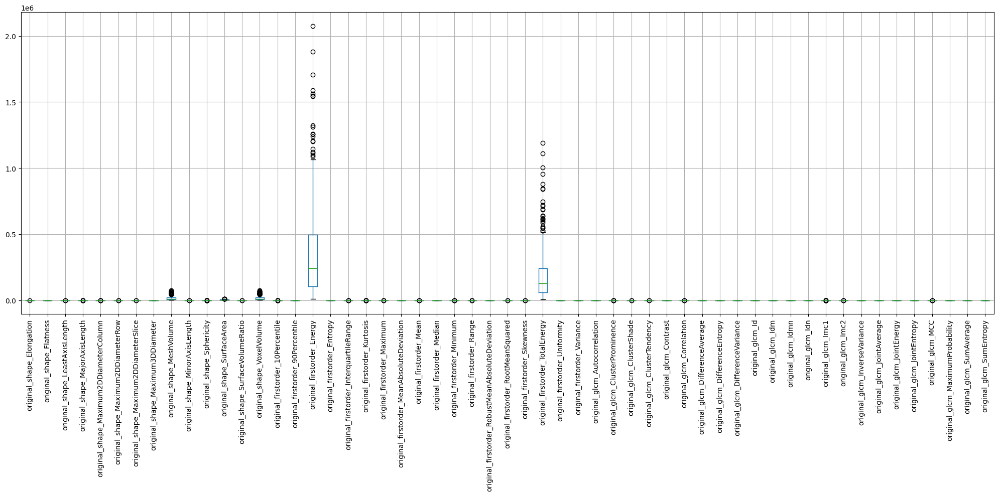

In [ ]:
# Plotting the boxplot again to check if the outliers are removed
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get first 55 features
box1 = iqr_features.iloc[:, 0:55]
box1.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

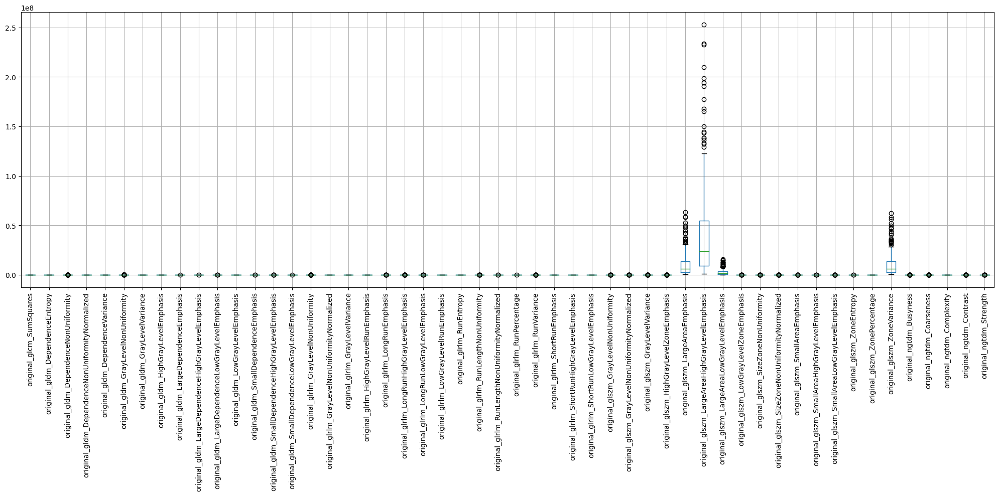

In [ ]:
# Plotting the boxplot again to check if the outliers are removed
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get the remaining features
box2 = iqr_features.iloc[:, 55:]
box2.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

#### Robust Covariance Method

In [ ]:
# Removing Outliers using RobustCovariance from the total_features dataframe
from sklearn.covariance import EllipticEnvelope
clf = EllipticEnvelope(random_state=0).fit(total_features)
robust_covariance = total_features[clf.predict(total_features) == 1]
robust_covariance

c:\Users\MOHD SUFYAN\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\covariance\_robust_covariance.py:747: UserWarning: The covariance matrix associated to your dataset is not full rank
  warnings.warn(
c:\Users\MOHD SUFYAN\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\covariance\_robust_covariance.py:186: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-1265.722817002660577 > -1287.802418085106410). You may want to try with a higher value of support_fraction (current value: 0.560).
  warnings.warn(
c:\Users\MOHD SUFYAN\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\covariance\_robust_covariance.py:186: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-1284.093254190175912 > -1287.141757279071498). You may want to try with a higher value of support_fraction (current value: 0.560).
  warnings.warn(
c:\Users\MOHD SUFYAN\AppData\Local\Pr

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength
0,0.891808,0.850437,29.186299,34.319179,36.073737,38.431136,39.309346,46.240422,19914.791496,30.606121,...,0.632174,0.594064,2.580368,0.004380,4.745944e+06,714.483384,0.000444,0.160234,0.019571,0.000443
1,0.668996,0.650923,18.931009,29.083312,23.148662,29.852205,29.748492,33.784677,6966.458183,19.456628,...,0.436616,0.436616,3.339987,0.003194,4.028316e+06,253.258853,0.001130,0.113070,0.008739,0.001129
2,0.934408,0.286810,13.808210,48.144081,40.488107,43.126056,56.606869,57.665740,19467.935987,44.986213,...,0.417277,0.417277,3.296646,0.004626,8.253185e+06,334.122497,0.000797,0.060139,0.002368,0.000793
3,0.707826,0.609522,8.893590,14.591090,11.420813,14.972284,14.477716,16.540987,871.867992,10.327956,...,0.472222,0.472222,1.921928,0.002806,5.031070e+05,1.433279,0.175459,0.006397,0.000027,0.162040
4,0.679296,0.424353,22.534695,53.103672,55.175581,49.674566,36.443449,58.274413,28042.704264,36.073114,...,0.566351,0.566351,2.307185,0.000783,5.665065e+07,26.382136,0.009536,0.004559,0.000020,0.009259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.877153,0.648783,29.186299,44.986213,45.886501,41.977361,51.383808,56.811793,33662.244229,39.459771,...,0.722445,0.443645,3.003142,0.000793,7.408352e+07,185.710080,0.001439,0.021210,0.000886,0.001411
918,0.964239,0.648439,13.914028,21.457727,21.631462,21.084250,25.375225,27.677709,4018.670942,20.690383,...,0.287859,0.287859,3.664977,0.004089,1.851005e+06,47.436404,0.005525,0.043527,0.001345,0.005336
919,0.877183,0.856791,15.749673,18.382163,19.038279,20.649190,20.505122,24.348411,3033.167788,16.124515,...,0.469783,0.469783,1.811278,0.001512,3.036683e+06,4.777973,0.052622,0.007182,0.000027,0.053438
920,0.913000,0.800835,33.226543,41.489900,43.076382,45.448460,48.143552,55.603011,33924.801358,37.880295,...,0.432663,0.432663,3.144687,0.001208,3.514451e+07,259.701406,0.001015,0.042512,0.001414,0.001006


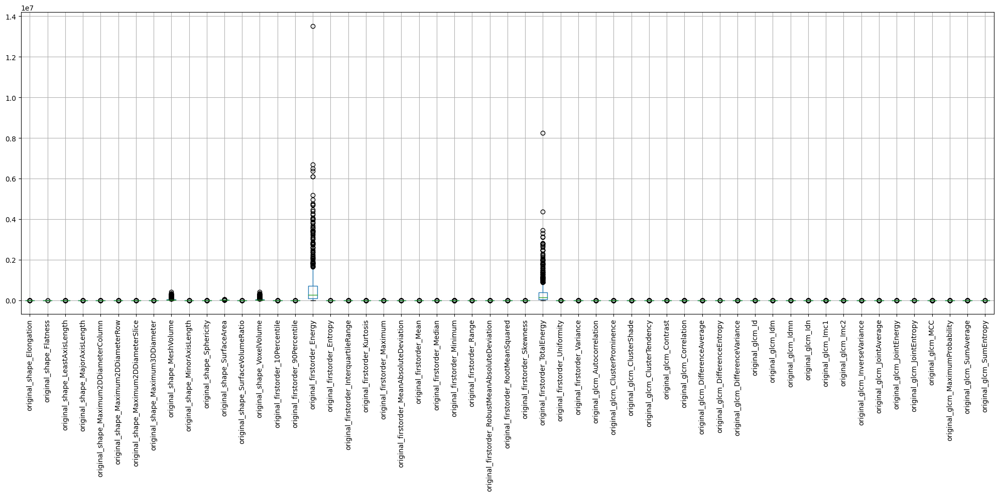

In [ ]:
# Plotting the boxplot again to check if the outliers are removed
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get first 55 features
box1 = robust_covariance.iloc[:, 0:55]
box1.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

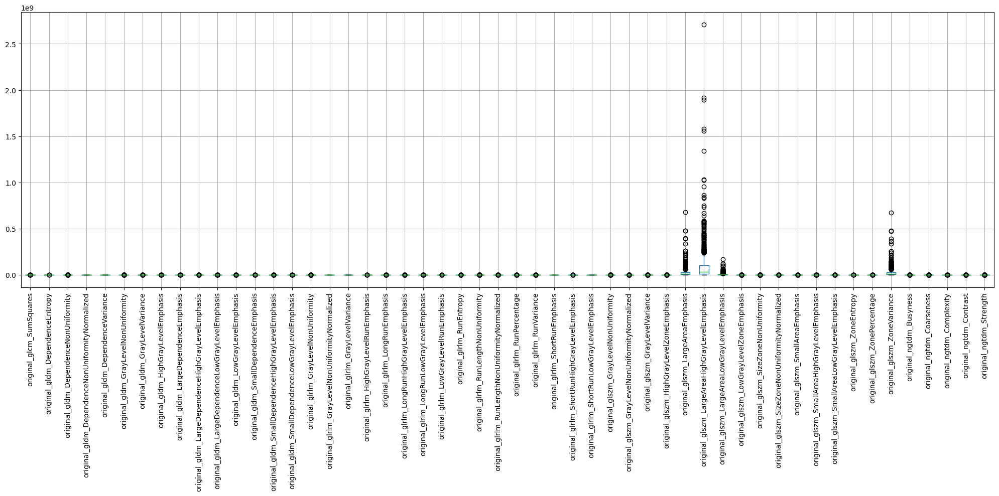

In [ ]:
# Plotting the boxplot again to check if the outliers are removed
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
# get the remaining features
box2 = robust_covariance.iloc[:, 55:]
box2.boxplot(ax=ax, rot=90, showfliers=True)
plt.tight_layout()
plt.show()

### Feature Engineering

In [61]:
clean_df = z_features
clean_df

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterColumn,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_MinorAxisLength,...,original_glszm_ZoneVariance,original_ngtdm_Busyness,original_ngtdm_Coarseness,original_ngtdm_Complexity,original_ngtdm_Contrast,original_ngtdm_Strength,ER,PR,HER2,Mol Subtype
0,0.807005,0.729780,23.614309,32.358102,36.073737,38.431136,39.309346,45.798426,11352.720347,26.113156,...,4.009263e+06,0.0,1000000.0,0.0,0.0,0.0,0,0,1,2
1,0.641558,0.577887,17.378564,30.072592,23.148662,29.852205,29.748492,33.784677,4051.005400,19.293327,...,6.054147e+06,0.0,1000000.0,0.0,0.0,0.0,0,0,0,3
2,0.756223,0.272616,13.050754,47.872295,40.488107,43.126056,56.606869,57.665740,11866.396187,36.202150,...,1.663605e+07,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
3,0.718139,0.610317,8.730117,14.304230,11.420813,14.972284,14.477716,16.540987,829.333325,10.272429,...,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
4,0.687760,0.436019,22.539193,51.693090,55.175581,49.674566,36.443449,58.274413,25572.814941,35.552459,...,4.436710e+08,0.0,1000000.0,0.0,0.0,0.0,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
916,0.975963,0.774499,68.771301,88.794509,114.415161,112.638536,102.065813,125.770251,211743.196733,86.660192,...,2.663537e+08,0.0,1000000.0,0.0,0.0,0.0,0,0,0,3
918,0.757419,0.596730,12.864613,21.558522,21.066007,20.543932,25.375225,27.268354,2558.161146,16.328835,...,4.485585e+06,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
919,0.872632,0.837806,15.199560,18.142097,19.038279,20.649190,20.505122,24.348411,2671.696974,15.831368,...,0.000000e+00,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0
920,0.855874,0.735409,30.453436,41.410193,43.076382,45.448460,48.143552,54.398662,28568.303573,35.441921,...,1.504081e+08,0.0,1000000.0,0.0,0.0,0.0,1,1,0,0


#### Heatmap

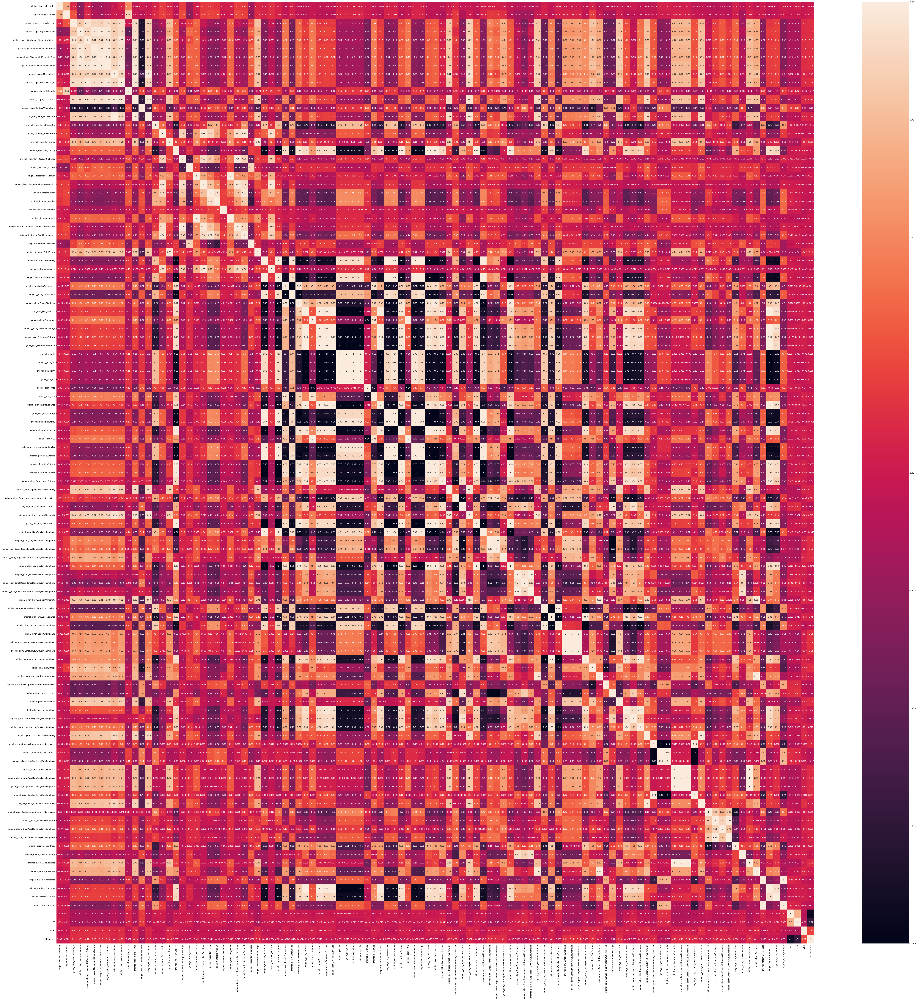

In [ ]:
plt.figure(figsize=(90, 90))
sns.heatmap(clean_df.corr(), annot=True)
plt.show()

#### Automated Feature Selection

In [ ]:
# Performing automated feature selection using SelectKBest
from sklearn.feature_selection import SelectKBest, chi2
X = clean_df.drop(columns = ['ER', 'PR', 'HER2', 'Mol Subtype'])
# Accounting for negative values
X = X + abs(X.min().min())
y = clean_df['ER']
bestfeatures = SelectKBest(score_func=chi2, k=55)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
# Concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Features','Score']  # Naming the dataframe columns
cols = featureScores.nlargest(55,'Score')['Features'].values
# print(cols)
# Taking the 55 best features and creating a new dataframe called selected_features_KBest
selected_features_KBest = clean_df[cols]
# Adding ['ER', 'PR', 'HER2', 'Mol Subtype'] to the dataframe
selected_features_KBest = pd.concat([selected_features_KBest, clean_df[['ER', 'PR', 'HER2', 'Mol Subtype']]], axis=1)
selected_features_KBest

,original_glszm_LargeAreaHighGrayLevelEmphasis,original_glszm_ZoneVariance,original_glszm_LargeAreaEmphasis,original_glszm_LargeAreaLowGrayLevelEmphasis,original_firstorder_Energy,original_firstorder_TotalEnergy,original_gldm_GrayLevelNonUniformity,original_gldm_DependenceNonUniformity,original_shape_VoxelVolume,original_shape_MeshVolume,...,original_glszm_SmallAreaHighGrayLevelEmphasis,original_glszm_SmallAreaEmphasis,original_glszm_SmallAreaLowGrayLevelEmphasis,original_glrlm_GrayLevelNonUniformityNormalized,original_firstorder_RobustMeanAbsoluteDeviation,original_firstorder_MeanAbsoluteDeviation,ER,PR,HER2,Mol Subtype
0,1.896064e+07,4.745944e+06,4.798072e+06,1.257430e+06,9.956355e+04,70719.961182,21246.814407,5144.741267,19947.346900,19914.791496,...,0.632174,0.601686,0.594064,0.513597,0.904171,1.168470,0,0,1,2
1,1.645068e+07,4.028316e+06,4.126310e+06,1.045217e+06,6.458797e+04,28823.203522,13234.642474,2988.916177,6984.903708,6966.458183,...,0.436616,0.436616,0.436616,0.572996,0.863922,1.134493,0,0,0,3
3,2.520503e+06,5.031070e+05,6.301280e+05,1.575342e+05,5.502444e+04,27201.314408,1768.054994,726.609428,880.931069,871.867992,...,0.472222,0.472222,0.472222,0.952435,1.813023,2.246487,1,1,0,0
4,2.331325e+08,5.665065e+07,5.828336e+07,1.457108e+07,6.240306e+05,380878.069807,45613.636348,31266.347913,28076.171875,28042.704264,...,0.566351,0.566351,0.566351,0.902334,1.091735,1.458315,1,0,1,1
5,2.182411e+07,5.068714e+06,5.458090e+06,1.366584e+06,1.537119e+05,71831.036014,8753.067521,3475.916453,4374.017710,4356.805140,...,0.505619,0.505619,0.505619,0.719354,1.101458,1.658691,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,8.774847e+06,2.126348e+06,2.194334e+06,5.492063e+05,1.443061e+05,82736.086156,8427.037037,3338.173351,5232.277267,5213.739358,...,0.353376,0.353376,0.353376,0.667455,1.842904,2.199778,1,1,0,0
918,7.642911e+06,1.851005e+06,1.910828e+06,4.778079e+05,5.043850e+04,24469.326002,7819.761424,2989.677249,4034.356873,4018.670942,...,0.287859,0.287859,0.287859,0.702522,0.964312,1.293813,1,1,0,0
919,1.389701e+07,3.036683e+06,3.474265e+06,8.685790e+05,7.387181e+04,42548.138893,5252.151172,2604.094482,3048.047080,3033.167788,...,0.469783,0.469783,0.469783,0.939061,1.322155,1.881858,1,1,0,0
920,1.432781e+08,3.514451e+07,3.583010e+07,8.968096e+06,1.017589e+06,745400.710662,43310.087000,24638.462474,33965.333948,33924.801358,...,0.432663,0.432663,0.432663,0.629915,1.401171,1.885139,1,1,0,0


In [62]:
# Performing automated feature selection using XGBoost
from xgboost import XGBClassifier
from sklearn.feature_selection import SelectFromModel
X = clean_df.drop(columns = ['ER', 'PR', 'HER2', 'Mol Subtype'])
y = clean_df['ER']
model = XGBClassifier()
model.fit(X, y)
# print(model.feature_importances_)

selection = SelectFromModel(model, threshold=0.01, prefit=True)
clf = selection.transform(X)
selected_features_XGBoost = pd.DataFrame(clf)
selected_features_XGBoost.columns = X.columns[selection.get_support()]
print("Dropped Features - ")
print(X.columns[~selection.get_support()])

selected_features_XGBoost['ER'] = [i for i in clean_df['ER']]
selected_features_XGBoost['PR'] = [i for i in clean_df['PR']]
selected_features_XGBoost['HER2'] = [i for i in clean_df['HER2']]
selected_features_XGBoost['Mol Subtype'] = [i for i in clean_df['Mol Subtype']]
selected_features_XGBoost

Dropped Features - 
Index(['original_shape_Maximum2DDiameterColumn',
       'original_shape_MinorAxisLength', 'original_firstorder_Entropy',
       'original_firstorder_Uniformity', 'original_glcm_Autocorrelation',
       'original_glcm_ClusterProminence', 'original_glcm_ClusterShade',
       'original_glcm_ClusterTendency', 'original_glcm_Contrast',
       'original_glcm_Correlation', 'original_glcm_DifferenceAverage',
       'original_glcm_DifferenceEntropy', 'original_glcm_DifferenceVariance',
       'original_glcm_Id', 'original_glcm_Idm', 'original_glcm_Idmn',
       'original_glcm_Idn', 'original_glcm_Imc1', 'original_glcm_Imc2',
       'original_glcm_InverseVariance', 'original_glcm_JointAverage',
       'original_glcm_JointEnergy', 'original_glcm_JointEntropy',
       'original_glcm_MCC', 'original_glcm_MaximumProbability',
       'original_glcm_SumAverage', 'original_glcm_SumEntropy',
       'original_glcm_SumSquares', 'original_gldm_GrayLevelVariance',
       'original_gldm_H

c:\Users\MOHD SUFYAN\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:457: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_Sphericity,original_shape_SurfaceArea,...,original_glszm_SizeZoneNonUniformity,original_glszm_SizeZoneNonUniformityNormalized,original_glszm_SmallAreaEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,ER,PR,HER2,Mol Subtype
0,0.807005,0.729780,23.614309,32.358102,38.431136,39.309346,45.798426,11352.720347,0.324793,7521.031831,...,21.338462,0.328284,5.741796e-01,2.136700e+00,0.003961,4.009263e+06,0,0,1,2
1,0.641558,0.577887,17.378564,30.072592,29.852205,29.748492,33.784677,4051.005400,0.339407,3620.810121,...,4.692308,0.360947,6.011205e-01,1.823026e+00,0.001401,6.054147e+06,0,0,0,3
2,0.756223,0.272616,13.050754,47.872295,43.126056,56.606869,57.665740,11866.396187,0.250417,10046.935178,...,10.473684,0.275623,5.064866e-01,2.281373e+00,0.001484,1.663605e+07,1,1,0,0
3,0.718139,0.610317,8.730117,14.304230,14.972284,14.477716,16.540987,829.333325,0.765256,557.823411,...,1.000000,1.000000,3.501278e-07,-3.203427e-16,0.000592,0.000000e+00,1,1,0,0
4,0.687760,0.436019,22.539193,51.693090,49.674566,36.443449,58.274413,25572.814941,0.451479,9297.483821,...,1.000000,0.500000,5.000000e-01,1.000000e+00,0.000047,4.436710e+08,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,0.975963,0.774499,68.771301,88.794509,112.638536,102.065813,125.770251,211743.196733,0.122433,140321.670242,...,161.066318,0.281093,5.418627e-01,2.603101e+00,0.001457,2.663537e+08,0,0,0,3
773,0.757419,0.596730,12.864613,21.558522,20.543932,25.375225,27.268354,2558.161146,0.480862,1881.115651,...,1.400000,0.280000,4.503200e-01,1.921928e+00,0.000938,4.485585e+06,1,1,0,0
774,0.872632,0.837806,15.199560,18.142097,20.649190,20.505122,24.348411,2671.696974,0.556035,1674.583798,...,1.000000,1.000000,4.626802e-08,-3.203427e-16,0.000215,0.000000e+00,1,1,0,0
775,0.855874,0.735409,30.453436,41.410193,45.448460,48.143552,54.398662,28568.303573,0.615378,7343.981946,...,2.111111,0.234568,4.008642e-01,2.197160e+00,0.000230,1.504081e+08,1,1,0,0


In [ ]:
# Performing automated feature selection using DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import SelectFromModel
X = clean_df.drop(columns = 'ER')
# Accounting for negative values
# X = X + abs(X.min().min())
y = clean_df['ER']
model = DecisionTreeClassifier()
model.fit(X, y)
# print(model.feature_importances_)
# Selecting 55 best features from the model and creating a new dataframe called selected_features_DecisionTree
selection = SelectFromModel(model, threshold=0.001, prefit=True)
clf = selection.transform(X)
selected_features_DecisionTree = pd.DataFrame(clf)
selected_features_DecisionTree.columns = X.columns[selection.get_support()]
print("Dropped Features - ")
print(X.columns[~selection.get_support()])
selected_features_DecisionTree['ER'] = [i for i in clean_df['ER']]
selected_features_DecisionTree['PR'] = [i for i in clean_df['PR']]
selected_features_DecisionTree['HER2'] = [i for i in clean_df['HER2']]
selected_features_DecisionTree['Mol Subtype'] = [i for i in clean_df['Mol Subtype']]
selected_features_DecisionTree

Dropped Features - 
Index(['original_shape_Flatness', 'original_shape_LeastAxisLength',
       'original_shape_MajorAxisLength', 'original_shape_Maximum2DDiameterRow',
       'original_shape_Maximum2DDiameterSlice',
       'original_shape_Maximum3DDiameter', 'original_shape_MeshVolume',
       'original_shape_MinorAxisLength', 'original_shape_Sphericity',
       'original_shape_SurfaceArea', 'original_shape_SurfaceVolumeRatio',
       'original_shape_VoxelVolume', 'original_firstorder_10Percentile',
       'original_firstorder_90Percentile', 'original_firstorder_Energy',
       'original_firstorder_Entropy', 'original_firstorder_InterquartileRange',
       'original_firstorder_Maximum',
       'original_firstorder_MeanAbsoluteDeviation', 'original_firstorder_Mean',
       'original_firstorder_Median', 'original_firstorder_Minimum',
       'original_firstorder_Range',
       'original_firstorder_RobustMeanAbsoluteDeviation',
       'original_firstorder_RootMeanSquared', 'original_firsto

c:\Users\MOHD SUFYAN\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:457: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


,original_shape_Elongation,original_shape_Maximum2DDiameterColumn,original_firstorder_Kurtosis,original_firstorder_TotalEnergy,original_glcm_ClusterProminence,original_glcm_ClusterTendency,original_gldm_SmallDependenceHighGrayLevelEmphasis,original_glszm_GrayLevelNonUniformity,original_glszm_SizeZoneNonUniformityNormalized,Mol Subtype,ER,PR,HER2
0,0.891808,36.073737,2.411175,70719.961182,0.559139,0.310508,0.014682,117.146341,0.339943,2,0,0,1
1,0.668996,23.148662,3.127936,28823.203522,0.359279,0.194684,0.011876,48.040000,0.187200,3,0,0,0
2,0.707826,11.420813,1.795163,27201.314408,0.008025,0.006527,0.011571,3.400000,0.280000,0,1,1,0
3,0.679296,55.175581,2.441939,380878.069807,0.025213,0.009676,0.007359,34.055556,0.310185,1,1,0,1
4,0.649722,19.491050,3.610341,71831.036014,0.180855,0.081880,0.010153,13.133333,0.262222,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
704,0.962911,23.690778,1.689122,82736.086156,0.192253,0.088856,0.011137,33.057143,0.149388,0,1,1,0
705,0.964239,21.631462,3.417082,24469.326002,0.120282,0.062897,0.010846,32.058824,0.107266,0,1,1,0
706,0.877183,19.038279,2.968618,42548.138893,0.012146,0.008545,0.009280,6.250000,0.312500,0,1,1,0
707,0.913000,43.076382,2.164032,745400.710662,0.193340,0.082466,0.008481,54.035714,0.195153,0,1,1,0


### Feature Scaling

In [63]:
engineered_features = selected_features_XGBoost
engineered_features

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_Sphericity,original_shape_SurfaceArea,...,original_glszm_SizeZoneNonUniformity,original_glszm_SizeZoneNonUniformityNormalized,original_glszm_SmallAreaEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,ER,PR,HER2,Mol Subtype
0,0.807005,0.729780,23.614309,32.358102,38.431136,39.309346,45.798426,11352.720347,0.324793,7521.031831,...,21.338462,0.328284,5.741796e-01,2.136700e+00,0.003961,4.009263e+06,0,0,1,2
1,0.641558,0.577887,17.378564,30.072592,29.852205,29.748492,33.784677,4051.005400,0.339407,3620.810121,...,4.692308,0.360947,6.011205e-01,1.823026e+00,0.001401,6.054147e+06,0,0,0,3
2,0.756223,0.272616,13.050754,47.872295,43.126056,56.606869,57.665740,11866.396187,0.250417,10046.935178,...,10.473684,0.275623,5.064866e-01,2.281373e+00,0.001484,1.663605e+07,1,1,0,0
3,0.718139,0.610317,8.730117,14.304230,14.972284,14.477716,16.540987,829.333325,0.765256,557.823411,...,1.000000,1.000000,3.501278e-07,-3.203427e-16,0.000592,0.000000e+00,1,1,0,0
4,0.687760,0.436019,22.539193,51.693090,49.674566,36.443449,58.274413,25572.814941,0.451479,9297.483821,...,1.000000,0.500000,5.000000e-01,1.000000e+00,0.000047,4.436710e+08,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,0.975963,0.774499,68.771301,88.794509,112.638536,102.065813,125.770251,211743.196733,0.122433,140321.670242,...,161.066318,0.281093,5.418627e-01,2.603101e+00,0.001457,2.663537e+08,0,0,0,3
773,0.757419,0.596730,12.864613,21.558522,20.543932,25.375225,27.268354,2558.161146,0.480862,1881.115651,...,1.400000,0.280000,4.503200e-01,1.921928e+00,0.000938,4.485585e+06,1,1,0,0
774,0.872632,0.837806,15.199560,18.142097,20.649190,20.505122,24.348411,2671.696974,0.556035,1674.583798,...,1.000000,1.000000,4.626802e-08,-3.203427e-16,0.000215,0.000000e+00,1,1,0,0
775,0.855874,0.735409,30.453436,41.410193,45.448460,48.143552,54.398662,28568.303573,0.615378,7343.981946,...,2.111111,0.234568,4.008642e-01,2.197160e+00,0.000230,1.504081e+08,1,1,0,0


In [64]:
# Scaling the data using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = engineered_features.drop(columns = ['ER', 'PR', 'HER2', 'Mol Subtype'])
scaled_features = scaler.fit_transform(X)
scaled_features = pd.DataFrame(scaled_features)

scaled_features.columns = X.columns
scaled_features['ER'] = [i for i in engineered_features['ER']]
scaled_features['PR'] = [i for i in engineered_features['PR']]
scaled_features['HER2'] = [i for i in engineered_features['HER2']]
scaled_features['Mol Subtype'] = [i for i in engineered_features['Mol Subtype']]
scaled_features

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_Sphericity,original_shape_SurfaceArea,...,original_glszm_SizeZoneNonUniformity,original_glszm_SizeZoneNonUniformityNormalized,original_glszm_SmallAreaEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,ER,PR,HER2,Mol Subtype
0,0.030271,0.610420,0.133286,-0.191054,0.014306,-0.040978,0.002282,-0.293777,-0.551061,-0.235833,...,0.371389,-0.602588,0.842883,0.694778,2.320683,-0.312360,0,0,1,2
1,-1.296841,-0.376208,-0.414414,-0.313791,-0.403504,-0.510730,-0.515526,-0.525513,-0.468179,-0.429865,...,-0.261415,-0.494865,0.948987,0.378456,0.304492,-0.305858,0,0,0,3
2,-0.377069,-2.359105,-0.794535,0.642091,0.242958,0.808898,0.513778,-0.277475,-0.972892,-0.110172,...,-0.041636,-0.776266,0.576281,0.840673,0.369128,-0.272212,1,1,0,0
3,-0.682557,-0.165557,-1.174026,-1.160585,-1.128185,-1.261026,-1.258751,-0.627760,1.947055,-0.582246,...,-0.401778,1.612769,-1.418462,-1.459966,-0.333484,-0.325108,1,1,0,0
4,-0.926238,-1.297713,0.038856,0.847276,0.561883,-0.181788,0.540013,0.157529,0.167448,-0.147456,...,-0.401778,-0.036259,0.550734,-0.451521,-0.762275,1.085564,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,1.385551,0.900894,4.099526,2.839700,3.628349,3.042424,3.449170,6.066057,-1.698759,6.370869,...,5.683152,-0.758227,0.715606,1.165118,0.348495,0.521776,0,0,0,3
773,-0.367479,-0.253814,-0.810884,-0.771014,-0.856835,-0.725601,-0.796388,-0.572892,0.334095,-0.516413,...,-0.386572,-0.761832,0.355075,0.478192,-0.060729,-0.310845,1,1,0,0
774,0.556686,1.312104,-0.605800,-0.954483,-0.851709,-0.964883,-0.922241,-0.569289,0.760443,-0.526688,...,-0.401778,1.612769,-1.418464,-1.459966,-0.630207,-0.325108,1,1,0,0
775,0.422269,0.646981,0.733982,0.295062,0.356063,0.393071,0.372963,0.252597,1.097013,-0.244641,...,-0.359539,-0.911669,0.160298,0.755748,-0.618095,0.153122,1,1,0,0


C:\Users\MOHD SUFYAN\AppData\Local\Temp\ipykernel_20128\2078727681.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(scaled_features[scaled_features.columns[col]], ax=ax[i][j])
C:\Users\MOHD SUFYAN\AppData\Local\Temp\ipykernel_20128\2078727681.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplo

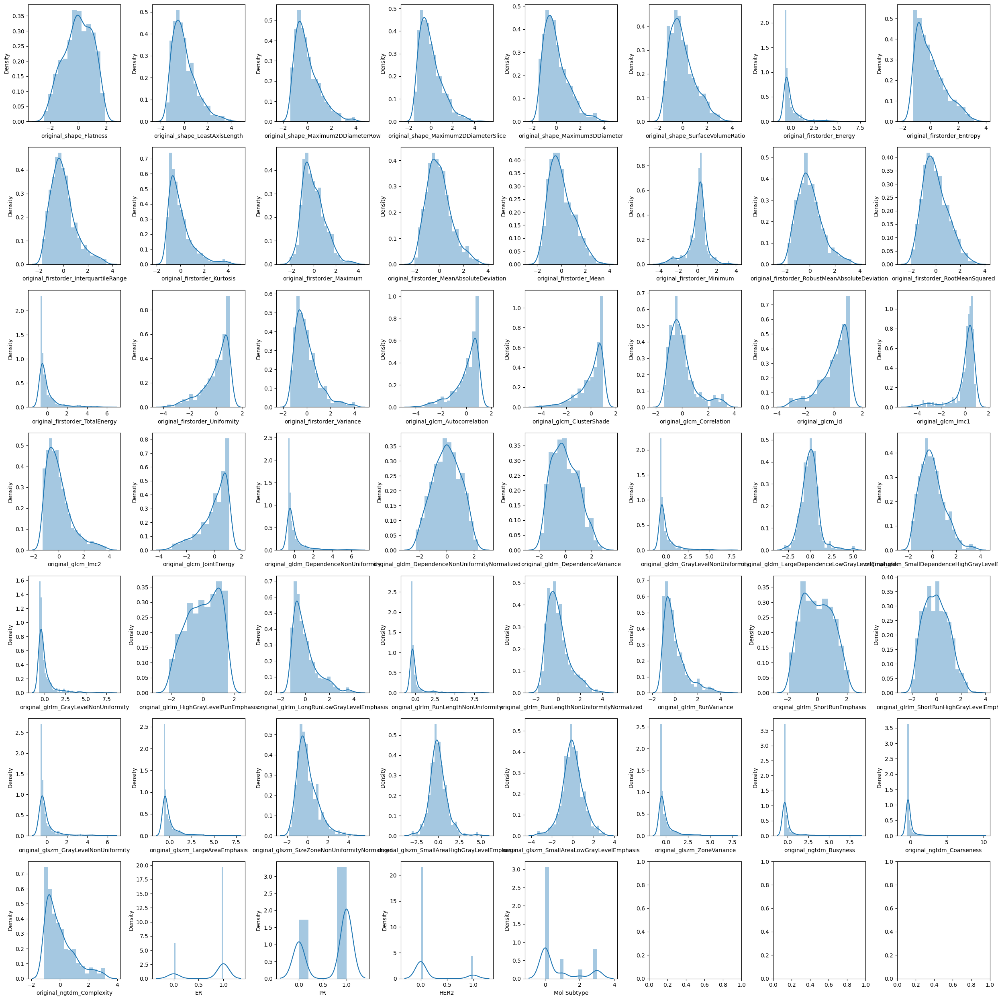

In [37]:
# Plotting distribution plots for each feature
n1 = 7
n2 = 8
fig, ax = plt.subplots(n1, n2, figsize=(25, 25))
col = 0
for i in range(n1):
  for j in range(n2):
    sns.distplot(scaled_features[scaled_features.columns[col]], ax=ax[i][j])
    ax[i][j].set_xlabel(scaled_features.columns[col])
    if col == len(scaled_features.columns)-1:
      break
    col+=1

plt.tight_layout()
plt.show()

### Checking and handling class imbalance

In [65]:
preprocessed_features = scaled_features
preprocessed_features

,original_shape_Elongation,original_shape_Flatness,original_shape_LeastAxisLength,original_shape_MajorAxisLength,original_shape_Maximum2DDiameterRow,original_shape_Maximum2DDiameterSlice,original_shape_Maximum3DDiameter,original_shape_MeshVolume,original_shape_Sphericity,original_shape_SurfaceArea,...,original_glszm_SizeZoneNonUniformity,original_glszm_SizeZoneNonUniformityNormalized,original_glszm_SmallAreaEmphasis,original_glszm_ZoneEntropy,original_glszm_ZonePercentage,original_glszm_ZoneVariance,ER,PR,HER2,Mol Subtype
0,0.030271,0.610420,0.133286,-0.191054,0.014306,-0.040978,0.002282,-0.293777,-0.551061,-0.235833,...,0.371389,-0.602588,0.842883,0.694778,2.320683,-0.312360,0,0,1,2
1,-1.296841,-0.376208,-0.414414,-0.313791,-0.403504,-0.510730,-0.515526,-0.525513,-0.468179,-0.429865,...,-0.261415,-0.494865,0.948987,0.378456,0.304492,-0.305858,0,0,0,3
2,-0.377069,-2.359105,-0.794535,0.642091,0.242958,0.808898,0.513778,-0.277475,-0.972892,-0.110172,...,-0.041636,-0.776266,0.576281,0.840673,0.369128,-0.272212,1,1,0,0
3,-0.682557,-0.165557,-1.174026,-1.160585,-1.128185,-1.261026,-1.258751,-0.627760,1.947055,-0.582246,...,-0.401778,1.612769,-1.418462,-1.459966,-0.333484,-0.325108,1,1,0,0
4,-0.926238,-1.297713,0.038856,0.847276,0.561883,-0.181788,0.540013,0.157529,0.167448,-0.147456,...,-0.401778,-0.036259,0.550734,-0.451521,-0.762275,1.085564,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,1.385551,0.900894,4.099526,2.839700,3.628349,3.042424,3.449170,6.066057,-1.698759,6.370869,...,5.683152,-0.758227,0.715606,1.165118,0.348495,0.521776,0,0,0,3
773,-0.367479,-0.253814,-0.810884,-0.771014,-0.856835,-0.725601,-0.796388,-0.572892,0.334095,-0.516413,...,-0.386572,-0.761832,0.355075,0.478192,-0.060729,-0.310845,1,1,0,0
774,0.556686,1.312104,-0.605800,-0.954483,-0.851709,-0.964883,-0.922241,-0.569289,0.760443,-0.526688,...,-0.401778,1.612769,-1.418464,-1.459966,-0.630207,-0.325108,1,1,0,0
775,0.422269,0.646981,0.733982,0.295062,0.356063,0.393071,0.372963,0.252597,1.097013,-0.244641,...,-0.359539,-0.911669,0.160298,0.755748,-0.618095,0.153122,1,1,0,0


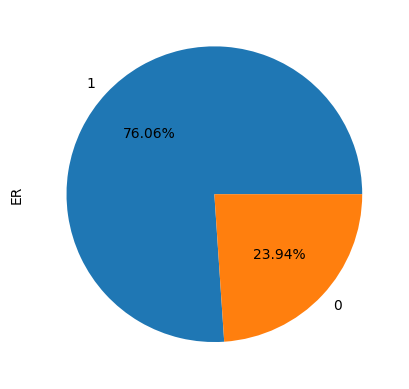

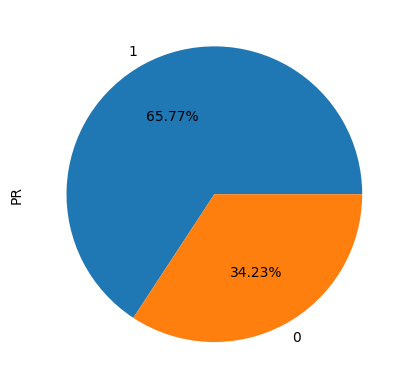

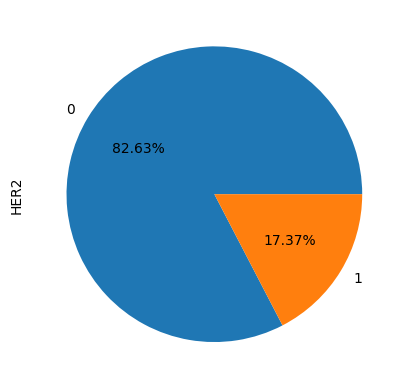

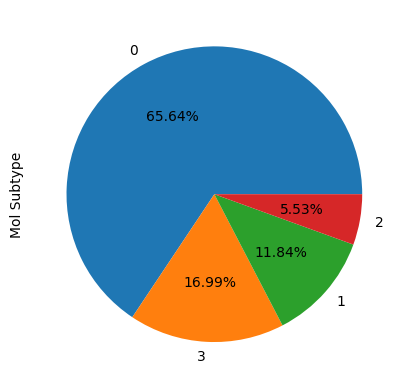

In [54]:
preprocessed_features['ER'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
preprocessed_features['PR'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
preprocessed_features['HER2'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
preprocessed_features['Mol Subtype'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()

##### We can see clearly that there is a class imbalance problem that occurs over here since majority of the data comes from class 0

In [66]:
# Resampling the dataset using SMOTE - Oversampling Technique
from imblearn.over_sampling import SMOTE

def over_sample(preprocessed_df):
    smote = SMOTE()

    x = preprocessed_df.iloc[:, :-1]
    y = preprocessed_df.iloc[:, -1]

    x, y = smote.fit_resample(x, y)
    return x,y

er_df = preprocessed_features.drop(columns = ['PR', 'HER2', 'Mol Subtype'])
pr_df = preprocessed_features.drop(columns = ['ER', 'HER2', 'Mol Subtype'])
her2_df = preprocessed_features.drop(columns = ['ER', 'PR', 'Mol Subtype'])
mol_df = preprocessed_features.drop(columns = ['ER', 'PR', 'HER2'])
x_sampled_er, y_sampled_er = over_sample(er_df)
x_sampled_pr, y_sampled_pr = over_sample(pr_df)
x_sampled_her2, y_sampled_her2 = over_sample(her2_df)
x_sampled_mol, y_sampled_mol = over_sample(mol_df)

# Converting the numpy arrays to dataframes
sampled_er = pd.DataFrame(x_sampled_er)
sampled_er['ER'] = y_sampled_er
sampled_pr = pd.DataFrame(x_sampled_pr)
sampled_pr['PR'] = y_sampled_pr
sampled_her2 = pd.DataFrame(x_sampled_her2)
sampled_her2['HER2'] = y_sampled_her2
sampled_mol = pd.DataFrame(x_sampled_mol)
sampled_mol['Mol Subtype'] = y_sampled_mol

# Printing the shape of the dataframes
print(x_sampled_er.shape)
print(x_sampled_pr.shape)
print(x_sampled_her2.shape)
print(x_sampled_mol.shape)

(1182, 52)
(1022, 52)
(1284, 52)
(2040, 52)


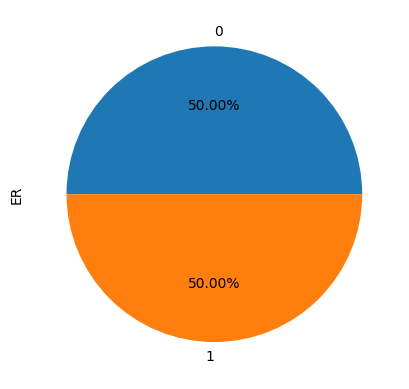

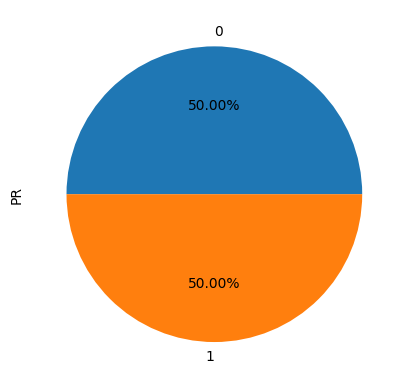

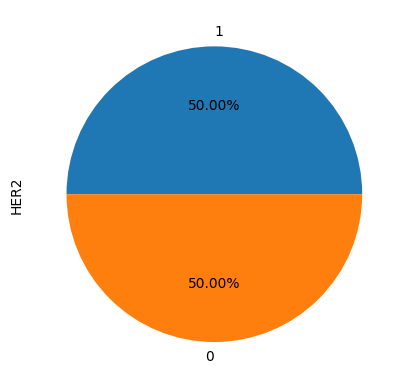

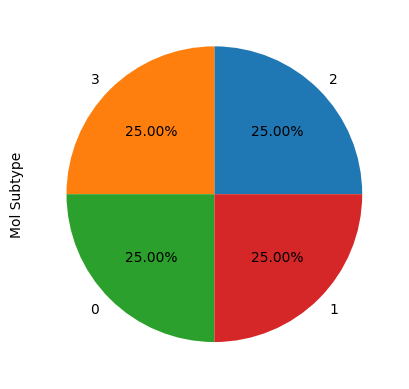

In [67]:
# Plot y_oversampled_er
y_sampled_er.value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
y_sampled_pr.value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
y_sampled_her2.value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
y_sampled_mol.value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()

In [57]:
# Saving the preprocessed dataframes to csv files
sampled_er.to_csv('preprocessed_er.csv', index=False)
sampled_pr.to_csv('preprocessed_pr.csv', index=False)
sampled_her2.to_csv('preprocessed_her2.csv', index=False)
sampled_mol.to_csv('preprocessed_mol.csv', index=False)

## Splitting the data into train_test_split ratios

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, f1_score, roc_auc_score

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

In [16]:
TRAIN_RATIO = 0.6
VAL_RATIO = 0.2
TEST_RATIO = 0.2

SEED = 2454259

In [17]:
def train_test_val_splits(df, train_ratio = 0.8, val_ratio = 0.2, random_state = 2454259):
   
    val_ratio_adj = val_ratio / (1-train_ratio)

    train_df, val_df = train_test_split(df, train_size = train_ratio, random_state= random_state)
    val_df, test_df = train_test_split(val_df, train_size = val_ratio_adj, random_state= random_state)

    # print("Length of training dataframe:", len(train_df))

    return train_df, val_df, test_df


In [18]:
# Splitting into training validation and testing dataframes
train_df_er, val_df_er, test_df_er = train_test_val_splits(sampled_er, TRAIN_RATIO, VAL_RATIO, random_state = SEED)
train_df_pr, val_df_pr, test_df_pr = train_test_val_splits(sampled_pr, TRAIN_RATIO, VAL_RATIO, random_state = SEED)
train_df_her2, val_df_her2, test_df_her2 = train_test_val_splits(sampled_her2, TRAIN_RATIO, VAL_RATIO, random_state = SEED)
train_df_mol, val_df_mol, test_df_mol = train_test_val_splits(sampled_mol, TRAIN_RATIO, VAL_RATIO, random_state = SEED)

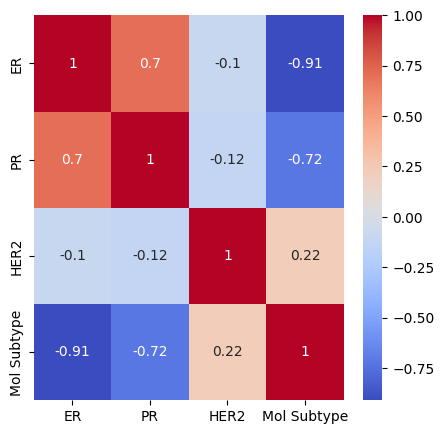

In [ ]:
# correlation heatmap
ds = scaled_features[['ER', 'PR', 'HER2', 'Mol Subtype']]
corr = ds.corr()
plt.figure(figsize = (5, 5))
sns.heatmap(corr, annot = True, cmap = 'coolwarm')
plt.show()

##### This implies that for the classification of each subtype, the other subtype will have an impact on it, i.e., for ER+/- classification, PR, HER2, Mol Subtype will be considered as features

In [19]:
# splitting the dataset for training, testing, validating on ER subtype
train_x_er, train_y_er = train_df_er.drop(columns = ['ER']), train_df_er['ER']
val_x_er, val_y_er = val_df_er.drop(columns = ['ER']), val_df_er['ER']
test_x_er, test_y_er = test_df_er.drop(columns = ['ER']), test_df_er['ER']

# splitting the dataset for training, testing, validating on PR subtype
train_x_pr, train_y_pr = train_df_pr.drop(columns = ['PR']), train_df_pr['PR']
val_x_pr, val_y_pr = val_df_pr.drop(columns = ['PR']), val_df_pr['PR']
test_x_pr, test_y_pr = test_df_pr.drop(columns = ['PR']), test_df_pr['PR']

# splitting the dataset for training, testing, validating on HER2 subtype
train_x_her2, train_y_her2 = train_df_her2.drop(columns = ['HER2']), train_df_her2['HER2']
val_x_her2, val_y_her2 = val_df_her2.drop(columns = ['HER2']), val_df_her2['HER2']
test_x_her2, test_y_her2 = test_df_her2.drop(columns = ['HER2']), test_df_her2['HER2']

# splitting the dataset for training, testing, validating on molecular subtype
train_x_mol_subtype, train_y_mol_subtype = train_df_mol.drop(columns = ['Mol Subtype']), train_df_mol['Mol Subtype']
val_x_mol_subtype, val_y_mol_subtype = val_df_mol.drop(columns = ['Mol Subtype']), val_df_mol['Mol Subtype']
test_x_mol_subtype, test_y_mol_subtype = test_df_mol.drop(columns = ['Mol Subtype']), test_df_mol['Mol Subtype']

### Class distribution in the train, test and val splits

In [20]:
dist = pd.DataFrame({'ER+': [train_y_er.value_counts()[0], val_y_er.value_counts()[0], test_y_er.value_counts()[0]],
                     'ER-': [train_y_er.value_counts()[1], val_y_er.value_counts()[1], test_y_er.value_counts()[1]],
                     'PR+': [train_y_pr.value_counts()[0], val_y_pr.value_counts()[0], test_y_pr.value_counts()[0]],
                     'PR-': [train_y_pr.value_counts()[1], val_y_pr.value_counts()[1], test_y_pr.value_counts()[1]],
                     'HER2+': [train_y_her2.value_counts()[0], val_y_her2.value_counts()[0], test_y_her2.value_counts()[0]],
                     'HER2-': [train_y_her2.value_counts()[1], val_y_her2.value_counts()[1], test_y_her2.value_counts()[1]],
                     'Mol Subtype (0)': [train_y_mol_subtype.value_counts()[0], val_y_mol_subtype.value_counts()[0], test_y_mol_subtype.value_counts()[0]],
                     'Mol Subtype (1)': [train_y_mol_subtype.value_counts()[1], val_y_mol_subtype.value_counts()[1], test_y_mol_subtype.value_counts()[1]],
                     'Mol Subtype (2)': [train_y_mol_subtype.value_counts()[2], val_y_mol_subtype.value_counts()[2], test_y_mol_subtype.value_counts()[2]],
                     'Mol Subtype (3)': [train_y_mol_subtype.value_counts()[3], val_y_mol_subtype.value_counts()[3], test_y_mol_subtype.value_counts()[3]]},
                     index = ['Train', 'Val', 'Test'])
dist

,ER+,ER-,PR+,PR-,HER2+,HER2-,Mol Subtype (0),Mol Subtype (1),Mol Subtype (2),Mol Subtype (3)
Train,315,329,275,281,359,347,284,282,281,271
Val,109,106,96,90,114,122,94,84,97,98
Test,113,102,93,93,116,120,88,100,88,97


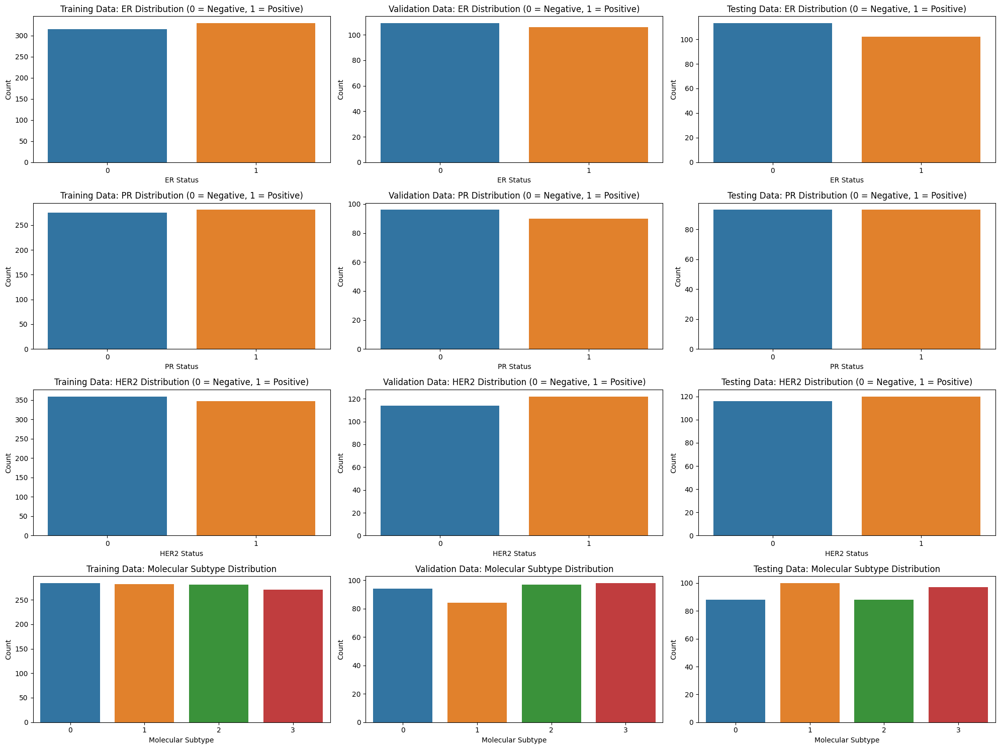

In [23]:
# creating multiple subplots of graph to visualise the above data 
fig, axes = plt.subplots(4, 3, figsize=(20, 15))
plot_data = [[train_y_er, val_y_er, test_y_er], [train_y_pr, val_y_pr, test_y_pr], [train_y_her2, val_y_her2, test_y_her2], [train_y_mol_subtype, val_y_mol_subtype, test_y_mol_subtype]]
for i in range(4):
    for j in range(3):
        sns.countplot(x=plot_data[i][j], ax=axes[i][j])
        if i == 0:
            axes[i][j].set_xlabel('ER Status')
            if j == 0:
                axes[i][j].set_title('Training Data: ER Distribution (0 = Negative, 1 = Positive)')
            elif j == 1:
                axes[i][j].set_title('Validation Data: ER Distribution (0 = Negative, 1 = Positive)')
            else:
                axes[i][j].set_title('Testing Data: ER Distribution (0 = Negative, 1 = Positive)')
        
        elif i == 1:
            axes[i][j].set_xlabel('PR Status')
            if j == 0:
                axes[i][j].set_title('Training Data: PR Distribution (0 = Negative, 1 = Positive)')
            elif j == 1:
                axes[i][j].set_title('Validation Data: PR Distribution (0 = Negative, 1 = Positive)')
            else:
                axes[i][j].set_title('Testing Data: PR Distribution (0 = Negative, 1 = Positive)')
        
        elif i == 2:
            axes[i][j].set_xlabel('HER2 Status')
            if j == 0:
                axes[i][j].set_title('Training Data: HER2 Distribution (0 = Negative, 1 = Positive)')
            elif j == 1:
                axes[i][j].set_title('Validation Data: HER2 Distribution (0 = Negative, 1 = Positive)')
            else:
                axes[i][j].set_title('Testing Data: HER2 Distribution (0 = Negative, 1 = Positive)')
        
        else:
            axes[i][j].set_xlabel('Molecular Subtype')
            if j == 0:
                axes[i][j].set_title('Training Data: Molecular Subtype Distribution')
            elif j == 1:
                axes[i][j].set_title('Validation Data: Molecular Subtype Distribution')
            else:
                axes[i][j].set_title('Testing Data: Molecular Subtype Distribution')

        axes[i][j].set_ylabel('Count')

plt.tight_layout()
plt.show()

Class Imbalance problem gone!

In [21]:
def train_pipeline(model, trainx, trainy, valx, valy):
    model.fit(trainx, trainy)
    preds = model.predict(trainx)
    preds_val = model.predict(valx)

    acc_train, acc_val = accuracy_score(trainy, preds), accuracy_score(valy, preds_val)
    prec_train, prec_val = precision_score(trainy, preds, average = 'weighted'), precision_score(valy, preds_val, average = 'weighted')
    rec_train, rec_val = recall_score(trainy, preds, average = 'weighted'), recall_score(valy, preds_val, average = 'weighted')
    f1_train, f1_val = f1_score(trainy, preds, average = 'weighted'), f1_score(valy, preds_val, average = 'weighted')

    metrics = {'train_acc' : acc_train, 'val_acc' : acc_val,
               'train_prec': prec_train, 'val_prec': prec_val,
               'train_rec' : rec_train,  'val_rec' : rec_val,
               'train_f1' : f1_train, 'val_f1': f1_val}


    print("Training Accuracy: {:.4f}, Validation Accuracy: {:.4f}".format(acc_train, acc_val))
    print("Training Precision: {:.4f}, Validation Precision: {:.4f}".format(prec_train, prec_val))
    print("Training Recall: {:.4f}, Validation Recall: {:.4f}".format(rec_train, rec_val))
    print("Training F1-Score: {:.4f}, Validation F1-Score: {:.4f}".format(f1_train, f1_val))

    return model, metrics

In [22]:
def get_classification_report(model, trainx, trainy, valx, valy, testx, testy, class_names, title, subtype = None):
    model, metrics = train_pipeline(model, trainx, trainy, valx, valy)
    pred = model.predict(testx)


    acc_test = accuracy_score(testy, pred)
    prec_test = precision_score(testy, pred, average = 'weighted')
    rec_test = recall_score(testy, pred, average = 'weighted')
    f1_test = f1_score(testy, pred, average = 'weighted')
    
    metrics.update(
            {'test_acc' : acc_test,
            'test_prec': prec_test,
            'test_rec' : rec_test,
            'test_f1' : f1_test})

    if len(trainy.unique()) == 2:
        probs = model.predict_proba(testx)
        aucroc = roc_auc_score(testy, probs[:, 1], average = 'weighted')
        metrics.update({'test_aucroc' : aucroc})

    # cls_report = classification_report(testy, pred, target_names = class_names, output_dict = True)
    # sns.heatmap(pd.DataFrame(cls_report).iloc[:-1, :].T, annot=True)
    # plt.title(title)
    return metrics, model

## Classifications

In [23]:
classification_results = pd.DataFrame()

### Logistic Regression

In [24]:
max_iter = 10000
logreg_er = LogisticRegression(max_iter = max_iter, random_state = SEED, class_weight = 'balanced')
report, logreg_er = get_classification_report(logreg_er, train_x_er, train_y_er, val_x_er, val_y_er, test_x_er, test_y_er, ['ER Negative', 'ER Positive'], 'ER Subtype metrics on testing set')

result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Logistic Regression'
result['Subtype'] = 'ER'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.6568, Validation Accuracy: 0.6605
Training Precision: 0.6604, Validation Precision: 0.6605
Training Recall: 0.6568, Validation Recall: 0.6605
Training F1-Score: 0.6559, Validation F1-Score: 0.6603


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.656832,0.660465,0.660364,0.660458,0.656832,0.660465,0.655915,0.660333,0.637209,0.637985,0.637209,0.633037,0.67248


In [101]:
max_iter = 10000
logreg_pr = LogisticRegression(max_iter = max_iter, random_state = SEED, class_weight = 'balanced')
report, logreg_pr = get_classification_report(logreg_pr, train_x_pr, train_y_pr, val_x_pr, val_y_pr, test_x_pr, test_y_pr, ['PR Negative', 'PR Positive'], 'PR Subtype metrics on testing set')

result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Logistic Regression'
result['Subtype'] = 'PR'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])

classification_results

Training Accuracy: 0.6277, Validation Accuracy: 0.5645


Training Precision: 0.6287, Validation Precision: 0.5678
Training Recall: 0.6277, Validation Recall: 0.5645
Training F1-Score: 0.6265, Validation F1-Score: 0.5634


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.64186,0.641311,0.64186,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.55914,0.560944,0.55914,0.555853,0.627703


In [102]:
max_iter = 10000
logreg_her2 = LogisticRegression(max_iter = max_iter, random_state = SEED, class_weight = 'balanced')
report, logreg_her2 = get_classification_report(logreg_her2, train_x_her2, train_y_her2, val_x_her2, val_y_her2, test_x_her2, test_y_her2, ['HER2 Negative', 'HER2 Positive'], 'HER2 Subtype metrics on testing set')

result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Logistic Regression'
result['Subtype'] = 'HER2'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.6629, Validation Accuracy: 0.6780
Training Precision: 0.6637, Validation Precision: 0.6778
Training Recall: 0.6629, Validation Recall: 0.6780
Training F1-Score: 0.6628, Validation F1-Score: 0.6777


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647


In [103]:
max_iter = 10000
logreg_mol_subtype = LogisticRegression(max_iter = max_iter, random_state = SEED, class_weight = 'balanced')
report, logreg_mol_subtype = get_classification_report(logreg_mol_subtype, train_x_mol_subtype, train_y_mol_subtype, val_x_mol_subtype, val_y_mol_subtype, test_x_mol_subtype, test_y_mol_subtype, ['Luminal', 'ER/PR pos, HER2 pos', 'HER2', 'Triple Negative'], 'Mol Subtype metrics on testing set')

result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Logistic Regression'
result['Subtype'] = 'Mol Subtype'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.5787, Validation Accuracy: 0.4987
Training Precision: 0.5729, Validation Precision: 0.4921
Training Recall: 0.5787, Validation Recall: 0.4987
Training F1-Score: 0.5727, Validation F1-Score: 0.4911


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN


### Gaussian NB

In [104]:
nb_er = GaussianNB()
report, nb_er = get_classification_report(nb_er, train_x_er, train_y_er, val_x_er, val_y_er, test_x_er, test_y_er, ['ER Negative', 'ER Positive'], 'ER Subtype metrics on testing set', subtype = 'ER')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Naive Bayes'
result['Subtype'] = 'ER'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.6149, Validation Accuracy: 0.6791
Training Precision: 0.6154, Validation Precision: 0.6844
Training Recall: 0.6149, Validation Recall: 0.6791
Training F1-Score: 0.6132, Validation F1-Score: 0.6774


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957


In [105]:
nb_pr = GaussianNB()
report, nb_pr = get_classification_report(nb_pr, train_x_pr, train_y_pr, val_x_pr, val_y_pr, test_x_pr, test_y_pr, ['PR Negative', 'PR Positive'], 'PR Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Naive Bayes'
result['Subtype'] = 'PR'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.5719, Validation Accuracy: 0.5484
Training Precision: 0.5733, Validation Precision: 0.5487
Training Recall: 0.5719, Validation Recall: 0.5484
Training F1-Score: 0.5709, Validation F1-Score: 0.5485


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895


In [106]:
nb_her2 = GaussianNB()
report, nb_her2 = get_classification_report(nb_her2, train_x_her2, train_y_her2, val_x_her2, val_y_her2, test_x_her2, test_y_her2, ['HER2 Negative', 'HER2 Positive'], 'HER2 Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Naive Bayes'
result['Subtype'] = 'HER2'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.5737, Validation Accuracy: 0.6441
Training Precision: 0.5790, Validation Precision: 0.6478
Training Recall: 0.5737, Validation Recall: 0.6441
Training F1-Score: 0.5693, Validation F1-Score: 0.6391


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856


In [107]:
nb_mol_subtype = GaussianNB()
report, nb_mol_subtype = get_classification_report(nb_mol_subtype, train_x_mol_subtype, train_y_mol_subtype, val_x_mol_subtype, val_y_mol_subtype, test_x_mol_subtype, test_y_mol_subtype, ['Luminal', 'ER/PR pos, HER2 pos', 'HER2', 'Triple Negative'], 'Mol Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Naive Bayes'
result['Subtype'] = 'Mol Subtype'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.4052, Validation Accuracy: 0.3646
Training Precision: 0.4125, Validation Precision: 0.3598
Training Recall: 0.4052, Validation Recall: 0.3646
Training F1-Score: 0.3903, Validation F1-Score: 0.3478


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN


### Random Forest

In [108]:
forest_er = RandomForestClassifier(n_estimators = 50, criterion = 'gini', max_depth = 6)
report, forest_er = get_classification_report(forest_er, train_x_er, train_y_er, val_x_er, val_y_er, test_x_er, test_y_er, ['ER Negative', 'ER Positive'], 'ER Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Random Forest'
result['Subtype'] = 'ER'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9224, Validation Accuracy: 0.7209
Training Precision: 0.9285, Validation Precision: 0.7233
Training Recall: 0.9224, Validation Recall: 0.7209
Training F1-Score: 0.9222, Validation F1-Score: 0.7198


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944


In [109]:
forest_pr = RandomForestClassifier(n_estimators = 20, criterion = 'gini', max_depth = 15)
report, forest_pr = get_classification_report(forest_pr, train_x_pr, train_y_pr, val_x_pr, val_y_pr, test_x_pr, test_y_pr, ['PR Negative', 'PR Positive'], 'PR Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Random Forest'
result['Subtype'] = 'PR'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9964, Validation Accuracy: 0.6237
Training Precision: 0.9964, Validation Precision: 0.6237
Training Recall: 0.9964, Validation Recall: 0.6237
Training F1-Score: 0.9964, Validation F1-Score: 0.6237


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [110]:
forest_her2 = RandomForestClassifier(n_estimators = 50, criterion = 'gini', max_depth = 20)
report, forest_her2 = get_classification_report(forest_her2, train_x_her2, train_y_her2, val_x_her2, val_y_her2, test_x_her2, test_y_her2, ['HER2 Negative', 'HER2 Positive'], 'HER2 Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Random Forest'
result['Subtype'] = 'HER2'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 1.0000, Validation Accuracy: 0.8390
Training Precision: 1.0000, Validation Precision: 0.8392
Training Recall: 1.0000, Validation Recall: 0.8390
Training F1-Score: 1.0000, Validation F1-Score: 0.8390


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [111]:
forest_mol_subtype = RandomForestClassifier(n_estimators = 50, criterion = 'gini', max_depth = 2)
report, forest_mol_subtype = get_classification_report(forest_mol_subtype, train_x_mol_subtype, train_y_mol_subtype, val_x_mol_subtype, val_y_mol_subtype, test_x_mol_subtype, test_y_mol_subtype, ['Luminal', 'ER/PR pos, HER2 pos', 'HER2', 'Triple Negative'], 'Mol Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Random Forest'
result['Subtype'] = 'Mol Subtype'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.4436, Validation Accuracy: 0.3941
Training Precision: 0.4604, Validation Precision: 0.3841
Training Recall: 0.4436, Validation Recall: 0.3941
Training F1-Score: 0.4258, Validation F1-Score: 0.3682


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


### Decision Trees

In [112]:
from sklearn.tree import DecisionTreeClassifier
dtree_er = DecisionTreeClassifier(criterion = 'gini', max_depth = 5)
report, dtree_er = get_classification_report(dtree_er, train_x_er, train_y_er, val_x_er, val_y_er, test_x_er, test_y_er, ['ER Negative', 'ER Positive'], 'ER Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Decision Tree'
result['Subtype'] = 'ER'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.7484, Validation Accuracy: 0.7070
Training Precision: 0.7764, Validation Precision: 0.7129
Training Recall: 0.7484, Validation Recall: 0.7070
Training F1-Score: 0.7431, Validation F1-Score: 0.7043


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [113]:
dtree_pr = DecisionTreeClassifier(criterion = 'gini', max_depth=5)
report, dtree_er = get_classification_report(dtree_pr, train_x_pr, train_y_pr, val_x_pr, val_y_pr, test_x_pr, test_y_pr, ['PR Negative', 'PR Positive'], 'PR Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Decision Tree'
result['Subtype'] = 'PR'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.7284, Validation Accuracy: 0.5753
Training Precision: 0.7306, Validation Precision: 0.5767
Training Recall: 0.7284, Validation Recall: 0.5753
Training F1-Score: 0.7275, Validation F1-Score: 0.5752


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [114]:
dtree_her2 = DecisionTreeClassifier(criterion = 'gini', max_depth=5)
report, dtree_her2 = get_classification_report(dtree_her2, train_x_her2, train_y_her2, val_x_her2, val_y_her2, test_x_her2, test_y_her2, ['HER2 Negative', 'HER2 Positive'], 'HER2 Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Decision Tree'
result['Subtype'] = 'HER2'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.7720, Validation Accuracy: 0.6610


Training Precision: 0.7871, Validation Precision: 0.6625
Training Recall: 0.7720, Validation Recall: 0.6610
Training F1-Score: 0.7695, Validation F1-Score: 0.6587


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [115]:
dtree_mol_subtype = DecisionTreeClassifier(criterion = 'gini', max_depth=5)
report, dtree_mol_subtype = get_classification_report(dtree_mol_subtype, train_x_mol_subtype, train_y_mol_subtype, val_x_mol_subtype, val_y_mol_subtype, test_x_mol_subtype, test_y_mol_subtype, ['Luminal', 'ER/PR pos, HER2 pos', 'HER2', 'Triple Negative'], 'Mol Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'Decision Tree'
result['Subtype'] = 'Mol Subtype'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.5742, Validation Accuracy: 0.4826
Training Precision: 0.6124, Validation Precision: 0.4960
Training Recall: 0.5742, Validation Recall: 0.4826
Training F1-Score: 0.5609, Validation F1-Score: 0.4637


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


### XGBoost

In [116]:
# XGBoost Classifier
xgb_er = xgb.XGBClassifier(learning_rate = 0.01, n_estimators = 100)
report, xgb_er = get_classification_report(xgb_er, train_x_er, train_y_er, val_x_er, val_y_er, test_x_er, test_y_er, ['ER Negative', 'ER Positive'], 'ER Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'XGBoost'
result['Subtype'] = 'ER'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.8975, Validation Accuracy: 0.7395
Training Precision: 0.9076, Validation Precision: 0.7432
Training Recall: 0.8975, Validation Recall: 0.7395
Training F1-Score: 0.8971, Validation F1-Score: 0.7382


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [117]:
xgb_pr = xgb.XGBClassifier(learning_rate = 0.01, n_estimators = 100)
report, xgb_pr = get_classification_report(xgb_pr, train_x_pr, train_y_pr, val_x_pr, val_y_pr, test_x_pr, test_y_pr, ['PR Negative', 'PR Positive'], 'PR Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'XGBoost'
result['Subtype'] = 'PR'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9568, Validation Accuracy: 0.5753
Training Precision: 0.9577, Validation Precision: 0.5773
Training Recall: 0.9568, Validation Recall: 0.5753
Training F1-Score: 0.9568, Validation F1-Score: 0.5749


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [118]:
xgb_her2 = xgb.XGBClassifier(learning_rate = 0.01, n_estimators = 100)
report, xgb_her2 = get_classification_report(xgb_her2, train_x_her2, train_y_her2, val_x_her2, val_y_her2, test_x_her2, test_y_her2, ['HER2 Negative', 'HER2 Positive'], 'HER2 Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'XGBoost'
result['Subtype'] = 'HER2'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9348, Validation Accuracy: 0.6992
Training Precision: 0.9369, Validation Precision: 0.6995
Training Recall: 0.9348, Validation Recall: 0.6992
Training F1-Score: 0.9348, Validation F1-Score: 0.6983


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [119]:
xgb_mol_subtype = xgb.XGBClassifier(learning_rate = 0.01, n_estimators = 100)
report, xgb_mol_subtype = get_classification_report(xgb_mol_subtype, train_x_mol_subtype, train_y_mol_subtype, val_x_mol_subtype, val_y_mol_subtype, test_x_mol_subtype, test_y_mol_subtype, ['Luminal', 'ER/PR pos, HER2 pos', 'HER2', 'Triple Negative'], 'Mol Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'XGBoost'
result['Subtype'] = 'Mol Subtype'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.8900, Validation Accuracy: 0.6461
Training Precision: 0.8923, Validation Precision: 0.6422
Training Recall: 0.8900, Validation Recall: 0.6461
Training F1-Score: 0.8884, Validation F1-Score: 0.6388


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


#### SVM

In [120]:
# SVM Classifier
svm_er = SVC(kernel = 'rbf', C = 1, gamma = 0.1, probability = True)
report, svm_er = get_classification_report(svm_er, train_x_er, train_y_er, val_x_er, val_y_er, test_x_er, test_y_er, ['ER Negative', 'ER Positive'], 'ER Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'SVM'
result['Subtype'] = 'ER'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9301, Validation Accuracy: 0.7907
Training Precision: 0.9309, Validation Precision: 0.7908
Training Recall: 0.9301, Validation Recall: 0.7907
Training F1-Score: 0.9301, Validation F1-Score: 0.7906


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [121]:
svm_pr = SVC(kernel = 'rbf', C = 1, gamma = 0.1, probability = True)
report, svm_pr = get_classification_report(svm_pr, train_x_pr, train_y_pr, val_x_pr, val_y_pr, test_x_pr, test_y_pr, ['PR Negative', 'PR Positive'], 'PR Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'SVM'
result['Subtype'] = 'PR'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9083, Validation Accuracy: 0.6344
Training Precision: 0.9085, Validation Precision: 0.6393
Training Recall: 0.9083, Validation Recall: 0.6344
Training F1-Score: 0.9082, Validation F1-Score: 0.6332


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [122]:
svm_her2 = SVC(kernel = 'rbf', C = 1, gamma = 0.1, probability = True)
report, svm_her2 = get_classification_report(svm_her2, train_x_her2, train_y_her2, val_x_her2, val_y_her2, test_x_her2, test_y_her2, ['HER2 Negative', 'HER2 Positive'], 'HER2 Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'SVM'
result['Subtype'] = 'HER2'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9433, Validation Accuracy: 0.7966
Training Precision: 0.9448, Validation Precision: 0.7966
Training Recall: 0.9433, Validation Recall: 0.7966
Training F1-Score: 0.9433, Validation F1-Score: 0.7965


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [123]:
svm_mol_subtype = SVC(kernel = 'rbf', C = 1, gamma = 0.1, probability = True)
report, svm_mol_subtype = get_classification_report(svm_mol_subtype, train_x_mol_subtype, train_y_mol_subtype, val_x_mol_subtype, val_y_mol_subtype, test_x_mol_subtype, test_y_mol_subtype, ['Luminal', 'ER/PR pos, HER2 pos', 'HER2', 'Triple Negative'], 'Mol Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'SVM'
result['Subtype'] = 'Mol Subtype'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

Training Accuracy: 0.9383, Validation Accuracy: 0.8311
Training Precision: 0.9383, Validation Precision: 0.8288
Training Recall: 0.9383, Validation Recall: 0.8311
Training F1-Score: 0.9378, Validation F1-Score: 0.8282


,Algorithm,Subtype,train_acc,val_acc,train_prec,val_prec,train_rec,val_rec,train_f1,val_f1,test_acc,test_prec,test_rec,test_f1,test_aucroc
0,Logistic Regression,ER,0.675466,0.693023,0.676494,0.693170,0.675466,0.693023,0.675391,0.693037,0.641860,0.641311,0.641860,0.640454,0.686361
0,Logistic Regression,PR,0.627698,0.564516,0.628681,0.567778,0.627698,0.564516,0.626471,0.563369,0.559140,0.560944,0.559140,0.555853,0.627703
0,Logistic Regression,HER2,0.662890,0.677966,0.663738,0.677800,0.662890,0.677966,0.662781,0.677688,0.618644,0.618622,0.618644,0.618233,0.675647
0,Logistic Regression,Mol Subtype,0.578712,0.498660,0.572921,0.492098,0.578712,0.498660,0.572730,0.491121,0.528150,0.525791,0.528150,0.526766,NaN
0,Naive Bayes,ER,0.614907,0.679070,0.615416,0.684366,0.614907,0.679070,0.613225,0.677410,0.548837,0.553042,0.548837,0.548251,0.614957
0,Naive Bayes,PR,0.571942,0.548387,0.573291,0.548723,0.571942,0.548387,0.570944,0.548492,0.580645,0.580795,0.580645,0.580451,0.589895
0,Naive Bayes,HER2,0.573654,0.644068,0.578954,0.647783,0.573654,0.644068,0.569337,0.639068,0.627119,0.629792,0.627119,0.623871,0.624856
0,Naive Bayes,Mol Subtype,0.405188,0.364611,0.412527,0.359761,0.405188,0.364611,0.390328,0.347821,0.364611,0.377624,0.364611,0.351032,NaN
0,Random Forest,ER,0.922360,0.720930,0.928499,0.723286,0.922360,0.720930,0.922189,0.719838,0.702326,0.703169,0.702326,0.700528,0.774944
0,Random Forest,PR,0.996403,0.623656,0.996429,0.623656,0.996403,0.623656,0.996403,0.623656,0.693548,0.693571,0.693548,0.693540,0.717829


In [98]:
# Save 
classification_results.to_csv('classification_results.csv', index = False)

#### KNN

In [97]:
# KNN Classifier
from sklearn.neighbors import KNeighborsClassifier
knn_er = KNeighborsClassifier(n_neighbors = 5)
report, knn_er = get_classification_report(knn_er, train_x_er, train_y_er, val_x_er, val_y_er, test_x_er, test_y_er, ['ER Negative', 'ER Positive'], 'ER Subtype metrics on testing set')
result = pd.DataFrame(report, index = [0])
result['Algorithm'] = 'KNN'
result['Subtype'] = 'ER'
result = result[list(result.columns[-2:]) + list(result.columns[:-2])]
classification_results = pd.concat([classification_results, result])
classification_results

AttributeError: 'Flags' object has no attribute 'c_contiguous'

### AutoML

In [ ]:
# %pip install tpot

     ---------------------------------------- 87.4/87.4 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 109.3/109.3 kB 6.6 MB/s eta 0:00:00
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=12034 sha256=4d3354a98decd9498c0e79f21e618b066d9138b447bb748f7fd6bbe7df7dac49
  Stored in directory: c:\users\mohd sufyan\appdata\local\pip\cache\wheels\af\f9\87\bf5b3d565c2a007b4dae9d8142dccc85a9f164e517062dd519
Successfully built stopit
Note: you may need to restart the kernel to use updated packages.


In [ ]:
# # classification_results.to_csv('without_class_imbalance_results.csv', index = False)
# from tpot import TPOTClassifier
# from sklearn.model_selection import RepeatedStratifiedKFold

# # define model evaluation procedure
# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# # define search
# model = TPOTClassifier(generations=5, population_size=50, cv=5, scoring='accuracy', verbosity=2, random_state=1, n_jobs=-1)
# # perform the search on ER subtype
# model.fit(train_x_er, train_y_er)
# # export the best model
# model.export('tpot_best_model.py')

# y_pred_tpot = model.predict(test_x_er)

# print('TPOT')
# print('Train Score:', model.score(train_x_er, train_y_er))
# print('Test Score:', model.score(test_x_er, test_y_er))
# print('Classification Report:', classification_report(test_y_er, y_pred_tpot))

Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]

: 